# Text Processing and Kmeans on Enron Email Dataset

In [ ]:
import pandas as pd
import numpy as np
import seayborn as sns
import matplotlib.pyplot as plt
import os
from os import path
%matplotlib inline
plt.rcParams["figure.figsize"] = [10, 5]
print(os.getcwd())

In [6]:
pd.set_option("display.max_columns",1000)
pd.set_option("display.max_rows",1000)
pd.set_option("display.width",1000)

In [22]:
#Espam is the original enron dataset with the spam column
email=pd.read_csv(r"C:\Users\faria\Documents\BAGO project material\final project\Enspam.csv")

In [24]:
email.head()

,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam
0,0,NaN,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0
1,1,Re:,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0
2,2,Re: test,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0
3,3,NaN,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0


# Getting Rid of Spam

In [26]:
#spammy domain names    
spam_domain=["@multexinvestornetwork.com", "salespoint.dealerconnection.com","newsletters.microsoft.com","@mailer.realage.com",
            "@outreach.futurestep.com","@mbox.surecom.com","@interchange-energy.com", "@compuserve.com", "@m2.innovyx.com",
           "@s2u2.com","@1800flowers.flonetwork.com","@shop2u.com","@cda01.cdnow.com","@lists.postmastergeneral.com","@postalmanager.com",
            "@tm02.com","@tm03.com","@skytel.com","@lists.economist.com","americanexpress","news",
            "@e-mailprograms.delta.com","@mail3.travelocity.com","@mailb.travelocity.com","@mail.abcnews.go.com", "@pagenetmessage.net","archwireless.net","371.net",
            "@em10.net","id.ru","@echostar.com","@6access.com","@meals.alazing.com","@mail.uole.com.ve","@amazon.com","@aboutdirect.com","aboutdirect.net",
            "@email.msn.com", "@shockwave.com","cooltravelassistant.com","@zdnetonebox.com","@lists.smartmoney.com","administration.enron@enron.com","@internetex.com",
            "@aei.org","aepin@aep.com", "@aggienetwork.com",".americangreetings.com", "offers","@post.intellimedia.com",
            "@yahoo-inc.com","alerts","alumni","@ameritrade.customer-email.com","desk",
            "announce","applicationservice@bdcimail.com",".apple.com","arsystem","notification","auction","bb4eb72a-172de319-86256aaa-4c9060@enron.com",
            ".mgmmirage.net","sportingbetusa.com","@beachheadmusic.com","bizness4u_shoemake@sprintmail.com","@m-ul.com","bmg","coupon","request","bounce","@clickaction.net",
             "support","economist","week","buy","cabbie@unm.edu","owner","list","sports",".ucla.edu","reply","special","auto", "card",
            "mazing","email","citibank","bot","reward","click","client","continental_airlines","@airmail.continental.com","digital","creek","communication","community",
            "saver","conference", "confirm","contact", "consumer", "member", "serv","custom","dailyquote","terrmail3.terrapinn.com","discount","disney", "distribution",
            "dream","ebay","bulletin", "delivery","editor", "market","energyinstitute","energygroup", "seminar", "ethink", "feedback","traffi","cheap","free","fool@motleyfool.com",
            "action","foreign","fortune", "money", "magazine","register" "remind","gold", "golf","gift","guarantee","prize","guest","treat", "cash","ixs1.net","info",
            "saving", "betquick", "quickbet", "design", "@insync-palm.com","invest","tv", "online","kc-mx.avantgo.com", "radioshack","outlook", "photo","tumble2.datek.com","postmaster","subscribe","xmr3.com",
            "deal","humor","sale","save","weight" "loss", "promo", "value", "webmaster","wizard","www","beach","survey","mailman","no.address","40enron","office.chairman","perfmgmt"]

def spamlabeler(dataset):
    for i in range(len(dataset)):
        for j in range(len(spam_domain)):
            word=spam_domain[j]
            if word in dataset.iloc[:, 9][i]:#the from(email) column
                dataset.iloc[:, 13][i]=1 #the spam column
    return dataset

In [28]:
spamlabeler(email)

<ipython-input-26-906e60692150>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset.iloc[:, 13][i]=1 #the spam column


,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam
0,0,NaN,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0
1,1,Re:,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0
2,2,Re: test,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0
3,3,NaN,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517396,517396,Trade with John Lavorato,"Wed, 28 Nov 2001 13:30:11 -0800 (PST)","Zufferli, John","Loibl, Kori",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,kori.loibl@enron.com,text/plain; charset=us-ascii,This is a trade with OIL-SPEC-HEDGE-NG (John L...,0
517397,517397,Gas Hedges,"Wed, 28 Nov 2001 12:47:48 -0800 (PST)","Zufferli, John","Lavorato, John",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Some of my position is with the Alberta Term b...,0
517398,517398,RE: CONFIDENTIAL,"Wed, 28 Nov 2001 07:20:00 -0800 (PST)","Zufferli, John","Doucet, Dawn",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,dawn.doucet@enron.com,text/plain; charset=us-ascii,2\n\n -----Original Message-----\nFrom: \tDouc...,0
517399,517399,Calgary Analyst/Associate,"Tue, 27 Nov 2001 11:52:45 -0800 (PST)","Zufferli, John","Slone, Jeanie",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,jeanie.slone@enron.com,text/plain; charset=us-ascii,Analyst\t\t\t\t\tRank\n\nStephane Brodeur\t\t\...,0


In [29]:
#spam=email[email["Spam"]==1]

In [51]:
spam.count()

Unnamed: 0      52749
Subject         52364
Date            52749
From(Name)      52340
To(Name)        49124
CC               3016
BCC                 2
Folder          52733
FileName        52496
From(email)     52749
To(email)       42554
ContentType     52733
EmailContent    52749
Spam            52749
dtype: int64

In [41]:
notspam=email[email["Spam"]==0]

In [49]:
email

,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam
0,0,NaN,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0
1,1,Re:,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0
2,2,Re: test,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0
3,3,NaN,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517396,517396,Trade with John Lavorato,"Wed, 28 Nov 2001 13:30:11 -0800 (PST)","Zufferli, John","Loibl, Kori",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,kori.loibl@enron.com,text/plain; charset=us-ascii,This is a trade with OIL-SPEC-HEDGE-NG (John L...,0
517397,517397,Gas Hedges,"Wed, 28 Nov 2001 12:47:48 -0800 (PST)","Zufferli, John","Lavorato, John",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Some of my position is with the Alberta Term b...,0
517398,517398,RE: CONFIDENTIAL,"Wed, 28 Nov 2001 07:20:00 -0800 (PST)","Zufferli, John","Doucet, Dawn",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,dawn.doucet@enron.com,text/plain; charset=us-ascii,2\n\n -----Original Message-----\nFrom: \tDouc...,0
517399,517399,Calgary Analyst/Associate,"Tue, 27 Nov 2001 11:52:45 -0800 (PST)","Zufferli, John","Slone, Jeanie",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,jeanie.slone@enron.com,text/plain; charset=us-ascii,Analyst\t\t\t\t\tRank\n\nStephane Brodeur\t\t\...,0


In [47]:
notspam.reset_index(drop=True)

,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam
0,0,NaN,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0
1,1,Re:,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0
2,2,Re: test,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0
3,3,NaN,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
464647,517396,Trade with John Lavorato,"Wed, 28 Nov 2001 13:30:11 -0800 (PST)","Zufferli, John","Loibl, Kori",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,kori.loibl@enron.com,text/plain; charset=us-ascii,This is a trade with OIL-SPEC-HEDGE-NG (John L...,0
464648,517397,Gas Hedges,"Wed, 28 Nov 2001 12:47:48 -0800 (PST)","Zufferli, John","Lavorato, John",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Some of my position is with the Alberta Term b...,0
464649,517398,RE: CONFIDENTIAL,"Wed, 28 Nov 2001 07:20:00 -0800 (PST)","Zufferli, John","Doucet, Dawn",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,dawn.doucet@enron.com,text/plain; charset=us-ascii,2\n\n -----Original Message-----\nFrom: \tDouc...,0
464650,517399,Calgary Analyst/Associate,"Tue, 27 Nov 2001 11:52:45 -0800 (PST)","Zufferli, John","Slone, Jeanie",NaN,NaN,"\ExMerge - Zufferli, John\Sent Items",john zufferli 6-26-02.PST,john.zufferli@enron.com,jeanie.slone@enron.com,text/plain; charset=us-ascii,Analyst\t\t\t\t\tRank\n\nStephane Brodeur\t\t\...,0


In [48]:
#notspam.to_csv("spamfreeenron.csv", index=False)

In [7]:
data=pd.read_csv(r"C:\Users\faria\Documents\BAGO project material\final project\spamfreeenron.csv")

In [8]:
datasub=data[:100]

In [9]:
datasub1=datasub

In [100]:
datasub.loc[0]["Date"]

'Mon, 14 May 2001 16:39:00 -0700 (PDT)'

# Convert timestamp into date-time objects

In [10]:
from datetime import datetime as dt

def converttime(dataset):
    for i in range(len(dataset)):
        datecol=dataset.loc[i]["Date"]
        date=datecol[:25]
        date=date.strip()
        date=dt.strptime(date, "%a, %d %b %Y %H:%M:%S")
        dataset.iloc[:,2][i]=date
    return dataset

In [11]:
converttime(datasub1)

<ipython-input-10-b28d90545bc8>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset.iloc[:,2][i]=date


,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam
0,0,NaN,2001-05-14 16:39:00,Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0
1,1,Re:,2001-05-04 13:51:00,Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0
2,2,Re: test,2000-10-18 03:00:00,Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0
3,3,NaN,2000-10-23 06:13:00,Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,2000-08-31 05:07:00,Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0
5,5,Re: Hello,2000-08-31 04:17:00,Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,"Greg,\n\n How about either next Tuesday or Thu...",0
6,6,NaN,2000-08-22 07:44:00,Phillip K Alle,"david.l.johnson@enron.com, John Shafe",NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,"david.l.johnson@enron.com, john.shafer@enron.com",text/plain; charset=us-ascii,Please cc the following distribution list with...,0
7,7,Re: PRC review - phone calls,2000-07-14 06:59:00,Phillip K Alle,Joyce Teixeir,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,joyce.teixeira@enron.com,text/plain; charset=us-ascii,any morning between 10 and 11:30,0
8,8,Re: High Speed Internet Access,2000-10-17 02:26:00,Phillip K Alle,Mark Scot,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,mark.scott@enron.com,text/plain; charset=us-ascii,1. login: pallen pw: ke9davis\n\n I don't thi...,0
9,9,FW: fixed forward or other Collar floor gas pr...,2000-10-16 06:44:00,Phillip K Alle,zimam@enron.co,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,zimam@enron.com,text/plain; charset=us-ascii,---------------------- Forwarded by Phillip K ...,0


In [7]:
#datasub = datasub.sort_values(by="")

# get rid of re and fwd in subject lines

In [57]:
# make everything lowercase before iterating through list
def cleansub(dataset,column):
    junk=["re:", "fwd:", "fw:"]
    dataset["CleanSub"]="" #create empty column
    vocab=""
    for index in range(len(dataset[column])):
        vstring=str(dataset.iloc[index][column])
        vstring1=vstring.lower()
        vlist=vstring1.split()
        vlist2=vlist.copy()
        ind=0
        for index1 in range(len(vlist2)):
            while ind <= (len(junk)-1):#iterate through junkword list 
                aword=junk[ind]
                bword=vlist2[index1].strip()
                if aword == bword: #if word from junkword list is found in word from clean word list
                    num=vlist2.index(bword) #find the index of the matching word
                    vlist2.pop(num) # remove that word from the clean word list
                    vlist2.insert(num,"") #add empty space to keep list from getting shorter
                ind+=1
            ind=0
        vlist3=vlist2.copy() #create copy of new cleaner list of words
        #print(vlist3)
        for item in range(len(vlist3)): #for each word in vlist3, if it is not an empty space, stem it and add it to a string
            thing=vlist3[item]
            if thing!='':
                vocab=vocab+" "+thing
        dataset.at[index,"CleanSub"]=vocab#add new clean string to the appropriate cell
        vocab=""
    
    return dataset

In [58]:
cleansub(datasub1, "Subject")

,Unnamed: 0,Subject,Date,CC,BCC,From(email),To(email),EmailContent,ThreadID,CleanSub
0,0,missing,2001-05-14 16:39:00,missing,missing,phillip.allen@enron.com,tim.belden@enron.com,Here is our forecast\n\n,0,missing
1,1,Re:,2001-05-04 13:51:00,missing,missing,phillip.allen@enron.com,john.lavorato@enron.com,Traveling to have a business meeting takes the...,0,
2,2,Re: test,2000-10-18 03:00:00,missing,missing,phillip.allen@enron.com,leah.arsdall@enron.com,test successful. way to go!!!,0,test
3,3,missing,2000-10-23 06:13:00,missing,missing,phillip.allen@enron.com,randall.gay@enron.com,"Randy,\n\n Can you send me a schedule of the s...",0,missing
4,4,Re: Hello,2000-08-31 05:07:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,Let's shoot for Tuesday at 11:45.,0,hello
5,5,Re: Hello,2000-08-31 04:17:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,"Greg,\n\n How about either next Tuesday or Thu...",0,hello
6,6,missing,2000-08-22 07:44:00,missing,missing,phillip.allen@enron.com,"david.l.johnson@enron.com, john.shafer@enron.com",Please cc the following distribution list with...,0,missing
7,7,Re: PRC review - phone calls,2000-07-14 06:59:00,missing,missing,phillip.allen@enron.com,joyce.teixeira@enron.com,any morning between 10 and 11:30,0,prc review - phone calls
8,8,Re: High Speed Internet Access,2000-10-17 02:26:00,missing,missing,phillip.allen@enron.com,mark.scott@enron.com,1. login: pallen pw: ke9davis\n\n I don't thi...,0,high speed internet access
9,9,FW: fixed forward or other Collar floor gas pr...,2000-10-16 06:44:00,missing,missing,phillip.allen@enron.com,zimam@enron.com,---------------------- Forwarded by Phillip K ...,0,fixed forward or other collar floor gas price...


In [54]:
sub="RE: FWD: The meeting is cancelled"
sub2=sub.lower()

sub2


're: fwd: the meeting is cancelled'

In [ ]:
        for item in range(len(wordlist)):
            word=wordlist[item].lower().strip()
            for item2 in range(len(junk)):
                phrase=junk[item2]
                if phrase!=word:
                    subjectlist.append(word)
        for i in subjectlist:
            subject=subject+" "+i
        dataset.at[index, "CleanSub"]=subject
         
    return dataset

# Label Threads with ThreadID

In [12]:
datasub1=datasub1.fillna(value="missing")
datasub1=datasub1.drop(columns=["From(Name)","To(Name)","Folder","FileName","ContentType","Spam"])
datasub1["ThreadID"]=0
datasub1.head(5)

,Unnamed: 0,Subject,Date,CC,BCC,From(email),To(email),EmailContent,ThreadID
0,0,missing,2001-05-14 16:39:00,missing,missing,phillip.allen@enron.com,tim.belden@enron.com,Here is our forecast\n\n,0
1,1,Re:,2001-05-04 13:51:00,missing,missing,phillip.allen@enron.com,john.lavorato@enron.com,Traveling to have a business meeting takes the...,0
2,2,Re: test,2000-10-18 03:00:00,missing,missing,phillip.allen@enron.com,leah.arsdall@enron.com,test successful. way to go!!!,0
3,3,missing,2000-10-23 06:13:00,missing,missing,phillip.allen@enron.com,randall.gay@enron.com,"Randy,\n\n Can you send me a schedule of the s...",0
4,4,Re: Hello,2000-08-31 05:07:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,Let's shoot for Tuesday at 11:45.,0


In [13]:
#label email threads
def thread(datasub):
    #datasub = datasub[~pd.isna(datasub.Subject)].reset_index(inplace=True)
    #todo: prefilter with Subject!=NaN
    #todo: check if groupby (pandas) will be quicker.
    ThreadID=0
    assigned_indices = []
    for i in range(len(datasub)):
        if datasub.at[i,'ThreadID']==0:
            # until j reaches 100
            ThreadID+=1
            j=i+1
            datasub.at[i,'ThreadID'] = ThreadID
            assigned_indices.append(i)
            while j <= (len(datasub)-1):
                if datasub.at[i,'Subject'] == datasub.at[j,'Subject'] and datasub.at[i,'From(email)'] == datasub.at[j,'From(email)'] and datasub.at[i,'To(email)'] == datasub.at[j,'To(email)'] and j not in assigned_indices:
                    datasub.at[j,'ThreadID'] = ThreadID #if the columns match, threadID is provided
                    assigned_indices.append(j)
                j+=1         
    return datasub

        
        

In [241]:
thread(datasub1).head(100)

,Unnamed: 0,Subject,Date,CC,BCC,From(email),To(email),EmailContent,ThreadID
0,0,missing,2001-05-14 16:39:00,missing,missing,phillip.allen@enron.com,tim.belden@enron.com,Here is our forecast\n\n,1
1,1,Re:,2001-05-04 13:51:00,missing,missing,phillip.allen@enron.com,john.lavorato@enron.com,Traveling to have a business meeting takes the...,2
2,2,Re: test,2000-10-18 03:00:00,missing,missing,phillip.allen@enron.com,leah.arsdall@enron.com,test successful. way to go!!!,3
3,3,missing,2000-10-23 06:13:00,missing,missing,phillip.allen@enron.com,randall.gay@enron.com,"Randy,\n\n Can you send me a schedule of the s...",4
4,4,Re: Hello,2000-08-31 05:07:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,Let's shoot for Tuesday at 11:45.,5
5,5,Re: Hello,2000-08-31 04:17:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,"Greg,\n\n How about either next Tuesday or Thu...",5
6,6,missing,2000-08-22 07:44:00,missing,missing,phillip.allen@enron.com,"david.l.johnson@enron.com, john.shafer@enron.com",Please cc the following distribution list with...,6
7,7,Re: PRC review - phone calls,2000-07-14 06:59:00,missing,missing,phillip.allen@enron.com,joyce.teixeira@enron.com,any morning between 10 and 11:30,7
8,8,Re: High Speed Internet Access,2000-10-17 02:26:00,missing,missing,phillip.allen@enron.com,mark.scott@enron.com,1. login: pallen pw: ke9davis\n\n I don't thi...,8
9,9,FW: fixed forward or other Collar floor gas pr...,2000-10-16 06:44:00,missing,missing,phillip.allen@enron.com,zimam@enron.com,---------------------- Forwarded by Phillip K ...,9


In [3]:
vlist=["hellow","hello","bye"]
string=""

for i in vlist:
    string=string+" "+i
print(string)
    

 hellow hello bye


# Clean Text to only contain words, no num, no alphanum

In [242]:
#Focus on enron senders 
datasub1["enron"]=0
def onlyenron(subset):
    for i in range(len(subset)):
        for item in subset.iloc[i, 3]:
            if item[-10:]!="@enron.com":
                subset["enron"]=1
    subset=subset[subset["enron"]==1]
    return subset

In [65]:
onlyenron(datasub1)

<ipython-input-64-517dcf372d1e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["enron"]=1


,Unnamed: 0,Subject,Date,From(Name),To(Name),CC,BCC,Folder,FileName,From(email),To(email),ContentType,EmailContent,Spam,enron
0,0,NaN,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",Phillip K Alle,Tim Belden,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,tim.belden@enron.com,text/plain; charset=us-ascii,Here is our forecast\n\n,0,1
1,1,Re:,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Phillip K Alle,John J Lavorato,NaN,NaN,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",pallen (Non-Privileged).pst,phillip.allen@enron.com,john.lavorato@enron.com,text/plain; charset=us-ascii,Traveling to have a business meeting takes the...,0,1
2,2,Re: test,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Phillip K Alle,Leah Van Arsdal,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,leah.arsdall@enron.com,text/plain; charset=us-ascii,test successful. way to go!!!,0,1
3,3,NaN,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",Phillip K Alle,Randall L Ga,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,randall.gay@enron.com,text/plain; charset=us-ascii,"Randy,\n\n Can you send me a schedule of the s...",0,1
4,4,Re: Hello,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,Let's shoot for Tuesday at 11:45.,0,1
5,5,Re: Hello,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",Phillip K Alle,Greg Pipe,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,greg.piper@enron.com,text/plain; charset=us-ascii,"Greg,\n\n How about either next Tuesday or Thu...",0,1
6,6,NaN,"Tue, 22 Aug 2000 07:44:00 -0700 (PDT)",Phillip K Alle,"david.l.johnson@enron.com, John Shafe",NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,"david.l.johnson@enron.com, john.shafer@enron.com",text/plain; charset=us-ascii,Please cc the following distribution list with...,0,1
7,7,Re: PRC review - phone calls,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)",Phillip K Alle,Joyce Teixeir,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,joyce.teixeira@enron.com,text/plain; charset=us-ascii,any morning between 10 and 11:30,0,1
8,8,Re: High Speed Internet Access,"Tue, 17 Oct 2000 02:26:00 -0700 (PDT)",Phillip K Alle,Mark Scot,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,mark.scott@enron.com,text/plain; charset=us-ascii,1. login: pallen pw: ke9davis\n\n I don't thi...,0,1
9,9,FW: fixed forward or other Collar floor gas pr...,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)",Phillip K Alle,zimam@enron.co,NaN,NaN,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,pallen.nsf,phillip.allen@enron.com,zimam@enron.com,text/plain; charset=us-ascii,---------------------- Forwarded by Phillip K ...,0,1


In [243]:

#use quotations when inputting column name
#change function to give back new strings instead of threads, also to change the dataframe cell in place
#get rid of stop words
#stem words
import re
import nltk
from nltk.corpus import stopwords 
from nltk.stem import PorterStemmer 
ps = PorterStemmer() 
junkwords=["day","houect","pm", "am", "cc", "bcc","or","subject","fw","forward","original","phil", "allen", "john","keith","holt","mike","grigsby",
          "steve","hunter","shiv","martin","arnold","janie","lavor","tom","ermis","chris","deb","neal","smith","mark","jan","feb",
          "march","april","may","june","july","aug","sept","oct","nov","dec", "from","www","http","lucy","gonzal","randy","zarin","imam","scott", "richard","paula",
          "enron","nancy","brenda","george","claud","larry","jim", "mich","lewter", "jeff","hotmail","msn","nowak","holst",
          "outlook","teamenron","migration","monique","sanchez","brandon","amir","charles","dave","donald","kathryn","felicia","joe",
          "leon","milton","rick","ann","laquitta","charlotte","gary","jen","andr","wesley","natali","joseph","william", "randall", "kendall",
          "meredith","shanna","tamara", "tracy", "jack", "kathy","lisa", "amgusa", "ruth","sid","camille","doe","mailbox", "ina", "rangel",
          "greg","piper","jean","rober","sean","tim","kevin","cooper","jay", "evans", "arthur","danny","matt","tori","brad",
          "alan","paul", "dale","leticia", "frank", "lance", "edgar", "gabriel", "brian", "delaney","david","lyndel","allison","joan",
          "cynthia","jess","kell", "craig", "kris", "lian","allan","bruce","jake", "shekar","bruce"]

def onlywords(dataset,column):
    dataset["CleanContent"]="" #create empty column
    vocab=""
    vlist2=[]
    stop_words = list(stopwords.words('english'))
    for index in range(len(dataset[column])):
        vstring=str(dataset.iloc[index][column])
        vlist=vstring.split()
        for i in range(len(vlist)): # for each word in the list
            word=vlist[i]
            if word not in stop_words: #if the word is not in the stop_words list, then make it lowercase and run it through regex stuff
                word=word.lower().strip()
                word=re.sub(r'(<)?[a-zA-Z0-9_.+-]+@[a-zA-z0-9]*.[a-zA-z0-9]*.(com|net)(>)?','' , word)#remove email addresses from email body
                word=re.sub(r'[!""#$%&''()*+,\'-./:;<=>?@[\]^_`{|}~\d+]','' , word)#remove num and punctuations from email body
            vlist2.append(word)#append clean word to a new list
        #print(vlist2)
        ind=0
        for index1 in range(len(vlist2)):
            while ind <= (len(junkwords)-1):#iterate through junkword list 
            #for ind in range(len(vlist2)):
                aword=junkwords[ind].strip()
                bword=vlist2[index1].strip()
                if aword in bword: #if word from junkword list is found in word from clean word list
                    num=vlist2.index(bword) #find the index of the matching word
                    vlist2.pop(num) # remove that word from the clean word list
                    vlist2.insert(num,"") #add empty space to keep list from getting shorter
                ind+=1
            ind=0
        vlist3=vlist2.copy() #create copy of new cleaner list of words
        #print(vlist3)
        for item in range(len(vlist3)): #for each word in vlist3, if it is not an empty space, stem it and add it to a string
            thing=vlist3[item]
            if thing!='':
                thing=ps.stem(thing)
                vocab=vocab+" "+thing
        dataset.at[index,"CleanContent"]=vocab#add new clean string to the appropriate cell
        vocab=""
        vlist2=[]
    
    return dataset

In [226]:
'holst'in junkwords

False

In [244]:
datasub2=onlywords(datasub1, 'EmailContent')
datasub2

,Unnamed: 0,Subject,Date,CC,BCC,From(email),To(email),EmailContent,ThreadID,enron,CleanContent
0,0,missing,2001-05-14 16:39:00,missing,missing,phillip.allen@enron.com,tim.belden@enron.com,Here is our forecast\n\n,1,0,here is our
1,1,Re:,2001-05-04 13:51:00,missing,missing,phillip.allen@enron.com,john.lavorato@enron.com,Traveling to have a business meeting takes the...,2,0,travel to have a busi meet take the fun out o...
2,2,Re: test,2000-10-18 03:00:00,missing,missing,phillip.allen@enron.com,leah.arsdall@enron.com,test successful. way to go!!!,3,0,test way to go
3,3,missing,2000-10-23 06:13:00,missing,missing,phillip.allen@enron.com,randall.gay@enron.com,"Randy,\n\n Can you send me a schedule of the s...",4,0,can you send me a schedul of the salari and l...
4,4,Re: Hello,2000-08-31 05:07:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,Let's shoot for Tuesday at 11:45.,5,0,let shoot at
5,5,Re: Hello,2000-08-31 04:17:00,missing,missing,phillip.allen@enron.com,greg.piper@enron.com,"Greg,\n\n How about either next Tuesday or Thu...",5,0,how about either next
6,6,missing,2000-08-22 07:44:00,missing,missing,phillip.allen@enron.com,"david.l.johnson@enron.com, john.shafer@enron.com",Please cc the following distribution list with...,6,0,pleas the follow distribut list with updat th...
7,7,Re: PRC review - phone calls,2000-07-14 06:59:00,missing,missing,phillip.allen@enron.com,joyce.teixeira@enron.com,any morning between 10 and 11:30,7,0,ani between and
8,8,Re: High Speed Internet Access,2000-10-17 02:26:00,missing,missing,phillip.allen@enron.com,mark.scott@enron.com,1. login: pallen pw: ke9davis\n\n I don't thi...,8,0,login pw kedavi i don't think these are requi...
9,9,FW: fixed forward or other Collar floor gas pr...,2000-10-16 06:44:00,missing,missing,phillip.allen@enron.com,zimam@enron.com,---------------------- Forwarded by Phillip K ...,9,0,by k on buckner buck on to fix other collar g...


In [212]:
len(datasub1["EmailContent"])

100

### Difference between "Clean Content" and "Email Content" (Original message)

In [225]:
datasub2.loc[6]["CleanContent"]

' pleas the follow distribut list with updat holst thank you your help'

In [115]:
dataset1=datasub.loc[61]["EmailContent"]
dataset1

'\n---------------------- Forwarded by Phillip K Allen/HOU/ECT on 05/01/2001 0=\n2:14 PM ---------------------------\n\n\nOutlook Migration Team@ENRON\n04/27/2001 01:01 PM\nTo:=09Allison Horton/NA/Enron@ENRON, Amir Baig/NA/Enron@ENRON, Brandon Bang=\nerter/NA/Enron@Enron, Brian Ellis/Corp/Enron@Enron, Charles Philpott/HR/Cor=\np/Enron@ENRON, Chris P Wood/NA/Enron@Enron, Chris Tull/HOU/ECT@ECT, Dale Sm=\nith/Corp/Enron@ENRON, Dave June/NA/Enron@ENRON, Donald Sutton/NA/Enron@Enro=\nn, Felicia Buenrostro/HR/Corp/Enron@ENRON, Johnna Morrison/Corp/Enron@ENRON=\n, Joe Dorn/Corp/Enron@ENRON, Kathryn Schultea/HR/Corp/Enron@ENRON, Leon McD=\nowell/NA/Enron@ENRON, Leticia Barrios/Corp/Enron@ENRON, Milton Brown/HR/Cor=\np/Enron@ENRON, Raj Perubhatla/Corp/Enron@Enron, Shekar Komatireddy/NA/Enron=\n@Enron, Andrea Yowman/Corp/Enron@ENRON, Angie O\'Brian/HR/Corp/Enron@ENRON, =\nBonne Castellano/HR/Corp/Enron@ENRON, Gwynn Gorsuch/NA/Enron@ENRON, Jo Ann =\nMatson/Corp/Enron@ENRON, LaQuitta Washington/H

In [197]:
import re
import nltk
from nltk.corpus import stopwords 
from nltk.stem import PorterStemmer 
ps = PorterStemmer() 
junkwords=["day","houect","pm", "am", "cc", "bcc","or","subject","fw","forward","original","phil", "allen", "john","keith","holt","mike","grigsby",
          "steve","hunter","shiv","martin","arnold","janie","lavorto","tom","ermis","chris","deb","neal","smith","mark","jan","feb",
          "march","april","may","june","july","aug","sept","oct","nov","dec", "from","www","http","lucy","gonzal","randy","zarin","imam","scott", "richard","paula",
          "enron","nancy","brenda","george","claudia","larry","jim", "mich","lewter", "jeff","hotmail","msn","nowak",
          "outlook","teamenron","migration","monique","sanchez","brandon","amir","charles","dave","donald","kathryn","felicia","joe",
          "leon","milton","rick","ann","laquitta","charlotte","gary","jen","andr","wesley","natali","joseph","william", "randall", "kendall",
          "meredith","shanna","tamara", "tracy", "jack", "kathy","lisa", "amgusa", "ruth","sid","camille","doe","mailbox", "ina", "rangel",
          "greg","piper","jean","rober","sean","tim","kevin","cooper","jay", "evans", "arthur","danny","matt","tori","brad",
          "alan","paul", "dale","leticia", "frank", "lance", "edgar", "gabriel", "brian", "delaney","david","lyndel","allison","joan",
          "cynthia","jess","kell", "craig", "kris"]
stop_words = list(stopwords.words('english'))
def test(dset):
    vocab=''
    vlist2=[]
    vlist=dset.split() #split the block of text into a list
    for i in range(len(vlist)): # for each word in the list
        word=vlist[i]
        if word not in stop_words: #if the word is not in the stop_words list, then make it lowercase and run it through regex stuff
            word=word.lower().strip()
            word=re.sub(r'(<)?[a-zA-Z0-9_.+-]+@[a-zA-z0-9]*.[a-zA-z0-9]*.(com|net)(>)?','' , word)
            word=re.sub(r'[!""#$%&''()*+,\'-./:;<=>?@[\]^_`{|}~\d+]','' , word)
        vlist2.append(word)
    #print(vlist2)
    ind=0
    for index in range(len(vlist2)):
        while ind <= (len(junkwords)-1):
        #for ind in range(len(vlist2)):
            aword=junkwords[ind].strip()
            bword=vlist2[index].strip()
            if aword in bword:
                num=vlist2.index(bword)
                vlist2.pop(num)
                vlist2.insert(num,"")
            ind+=1
        ind=0
    vlist3=vlist2.copy()
    #print(vlist3)
    for item in vlist3:
        if item!='':
            item=ps.stem(item)
            vocab=vocab+" "+item
    return vocab

    

In [198]:
test(dataset1)


' by k on bang p sm n mcd raj shekar angi bonn gwynn jo valeria a ho ronald bobbi mcni princen blair nifer commun lit ron darvin old redicknaen a on upto o gdenhoustoneotteott j ane m uectect k l kuy h mari theresa na tali alvin thompsonco ect collinshoueese a lia t commun icat commun nguyen goulart a owa pleas print thi now current note user reason use web owa onc your ha been migrat note to the c lient will be configur on your comput after of your you will not be abl to send reciev ma il via note and you will not be abl to start use until it is c onfigur by the the after your is m igrat dure thi period you can use web owa via your web browser internet to read and send mail pleas note your calendar entri person address book journal and t odo entri note will not be avail until the cl ient is configur on your desktop remot to your after your client is configur you can use web ow a remot to your pleas note at thi the owa client is onli while connect ing to the lan there are futur plan to

In [199]:
junkwords=["day","houectect" "pm", "am", "cc", "bcc","or","subject","fw","forward","original","phil", "allen", "john","keith","holt","mike","grigsby",
          "steve","hunter","shively","martin","arnold","janie","lavorato","tom","ermis","chris","deb","neal","smith","mark","jan","feb",
          "march","april","may","june","july","august","sept","oct","nov","dec", "from","www","http","lucy","gonzal","randy","zarin","imam","scott", "richard","paula",
          "enron","nancy","brenda","george","claudia","larry","jim", "mich","lewter", "jeff","hotmail","msn","nowak",
          "outlook","teamenron","migration","monique","sanchez","brandon","amir","charles","dave","donald","kathryn","felicia","joe",
          "leon","milton","rick","ann","laquitta","charlotte","gary","jen","andr","wesley","natali","joseph","william", "randall", "kendall",
          "meredith","shanna","tamara", "tracy", "jack", "kathy","lisa", "amgusa", "ruth","sid","camille","doe","mailbox", "ina", "rangel",
          "greg","piper","jean","robert","sean","tim","kevin","cooper","jay", "evans", "arthur","danny","matt","tori","brad",
          "alan","paul"]

s1=[]
for index in range(len(junkwords)):
    word=junkwords[index]
    if word in "larry":
        continue
        s1.append(word)
        print(s1)
        

In [171]:
'pm' in junkwords


False

In [325]:
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [245]:
corpus=datasub2["CleanContent"]
corpus

0                                           here is our
1      travel to have a busi meet take the fun out o...
2                                        test way to go
3      can you send me a schedul of the salari and l...
4                                          let shoot at
5                                 how about either next
6      pleas the follow distribut list with updat th...
7                                       ani between and
8      login pw kedavi i don't think these are requi...
9      by k on buckner buck on to fix other collar g...
10     mr buckner deliv ga behind san diego energi s...
11     here are the rentrol open them and save in th...
12     by k on burchfield to k beth consolid posit i...
13     by k on burchfield to k beth consolid posit i...
14     here are the of the west desk member by the i...
15                                      million is fine
16     by k on arteaga to k thoma a grant ted vladim...
17     is have problem with the west power site 

# TFIDF and Kmeans clustering

In [ ]:
#Keyword extraction
#bigrams tfidf
#phrase extraction


# Elbow Method

In [246]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)
idf_df=pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names())
idf_df


abil       abl     about      abov  abovenet    abroad        ac       acr    across    action     activ    actual        ad       add     addit   address    adjoin    adjust  administr     advoc      aeco    affair    affect     after  afternoon     again   against       ago  agreement  agreementi     ahead       aid    ailbox  albuquerqu       all     allow     allud    almost     along  alonsopdxectect      alot   alreadi      also    altern  although     alvin     alway        an   analysi   analyst       and       ane     angel      angi       ani     anoth    answer       ant   anticip   antonio     anyon    anyth     apart  apartmenty       apb    appear   appetit    applic   apprais   appreci  appropri    approv  approxim       apt      arac  architectur       are      area     arena    around    arrang   arteaga        as      asap       ask       ass    assess    assist    associ     assur        at    attach   attempt    attend    attent     atti   attract  \
0   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000   0.000000     0.00000  0.000000  0.000000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000   
1   0.000000  0.000000  0.055765  0.000000  0.000000  0.000000  0.000000  0.000000  0.075094  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000   0.000000     0.00000  0.000000  0.000000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.209134  0.000000  0.000000  0.000000  0.050748  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000     0.000000  0.042749  0.000000  0.000000  0.000000  0.000000  0.000000  0.087979  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000   
2   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000  0.000000  0.000000   0.000000     0.00000  0.000000  0.000000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000   
3   0.000000  0.000000  0.000000  0.

In [97]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer2 = TfidfVectorizer(ngram_range=(2,2))
X2 = vectorizer2.fit_transform(corpus)
idf_df=pd.DataFrame(X2.toarray(), columns=vectorizer2.get_feature_names())
idf_df

abil complet  abil handl  abil includ  abil isol  abil properli  abil revalu  abil split   abil td  abil view  abl determin   abl log  abl mani  abl obtain  abl purchas  abl reach  abl send  abl stand  abl start  abl view  about enrononlin  abovenet globix  abroad how  ac bought  acceler quantum  accept brenda  accept coa  accept colleen  accept forward  accept jeffrey  accept offer  accept russ  accept russel  accept scott  accept tariff  access anyon  access connect  access emailcalendar  access enrononlin  access favorit  access internet  access mailbox  access new  access outlook  access ow  access owa  access share  access west  accommod creeksid  accomplish project  account control  account custom  account execut  account thank  accur ga  accur indec  accur indic  accur rent  acr squarefoot  across differ  across duplex  across ga  across larg  across street  action plan  action requir  activ password  activ second  actual done  actual expens  actual ga  actual need  \
0       0.000000    0.000000     0.000000   0.000000       0.000000     0.000000    0.000000  0.000000   0.000000      0.000000  0.000000  0.000000    0.000000     0.000000   0.000000  0.000000   0.000000   0.000000  0.000000          0.000000         0.000000    0.000000   0.000000         0.000000       0.000000    0.000000        0.000000        0.000000        0.000000      0.000000     0.000000       0.000000      0.000000       0.000000      0.000000        0.000000              0.000000           0.000000        0.000000         0.000000        0.000000    0.000000        0.000000   0.000000    0.000000      0.000000     0.000000           0.000000            0.000000         0.000000          0.0000        0.000000       0.000000  0.000000     0.000000     0.000000    0.000000        0.000000       0.000000       0.000000   0.000000       0.0000       0.000000     0.000000       0.000000        0.000000      0.000000     0.000000       0.000000   0.000000     0.000000   
1       0.000000    0.000000     0.000000   0.000000       0.000000     0.000000    0.000000  0.000000   0.000000      0.000000  0.000000  0.000000    0.000000     0.000000   0.000000  0.000000   0.000000   0.000000  0.000000          0.000000         0.000000    0.000000   0.000000         0.000000       0.000000    0.000000        0.000000        0.000000        0.000000      0.000000     0.000000       0.000000      0.000000       0.000000      0.000000        0.000000              0.000000           0.000000        0.000000         0.000000        0.000000    0.000000        0.000000   0.000000    0.000000      0.000000     0.000000           0.000000            0.000000         0.000000          0.0000        0.000000       0.000000  0.000000     0.000000     0.000000    0.000000        0.000000       0.108297       0.000000   0.000000       0.0000       0.000000     0.000000       0.000000        0.000000      0.000000     0.000000       0.000000   0.000000     0.000000   
2       0.000000    0.000000     0.000000   0.000000       0.000000     0.000000    0.000000  0.000000   0.000000      0.000000  0.000000  0.000000    0.000000     0.000000   0.000000  0.000000   0.000000   0.000000  0.000000          0.000000         0.000000    0.000000   0.000000         0.000000       0.000000    0.000000        0.000000        0.000000        0.000000      0.000000     0.000000       0.000000      0.000000       0.000000      0.000000        0.000000              0.000000           0.000000        0.000000         0.000000        0.000000    0.000000        0.000000   0.000000    0.000000      0.000000     0.000000           0.000000            0.000000         0.000000          0.0000        0.000000       0.000000  0.000000     0.000000     0.000000    0.000000        0.000000       0.000000       0.000000   0.000000       0.0000       0.000000     0.000000       0.000000        0.000000      0.000000     0.000000       0.000000   0.000000     0.000000   
3       0.000000    0.000000

In [99]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer3 = TfidfVectorizer(ngram_range=(3,3))
X3 = vectorizer3.fit_transform(corpus)
idf_df=pd.DataFrame(X3.toarray(), columns=vectorizer3.get_feature_names())
idf_df

abil complet form  abil handl volatil  abil includ ga  abil isol posit  abil properli show  abil revalu option  abil split current  abil td pull  abil view chang  abl determin one  abl log enron  abl mani thin  abl obtain third  abl purchas addit  abl reach consensu  abl send reciev  abl stand util  abl start use  abl view mailbox  about enrononlin home  about enrononlin use  abovenet globix hostpro  abroad how to  ac bought today  acceler quantum way  accept coa thi  accept colleen sullivan  accept forward phillip  accept jeffrey gossett  accept offer thursday  accept russ severson  accept russel long  accept scott mill  accept tariff new  access anyon emailcalendar  access connect ing  access emailcalendar if  access emailcalendar ye  access enrononlin pleas  access favorit web  access internet conduct  access mailbox after  access mailbox pleas  access new west  access outlook web  access ow remot  access owa launch  access owa onc  access owa via  access share calendar  \
0            0.000000            0.000000        0.000000         0.000000            0.000000            0.000000            0.000000      0.000000         0.000000          0.000000       0.000000       0.000000          0.000000           0.000000            0.000000         0.000000        0.000000       0.000000          0.000000               0.000000              0.000000                 0.000000       0.000000         0.000000             0.000000        0.000000                 0.000000                0.000000                0.000000                0.00000              0.000000            0.000000           0.000000           0.000000                    0.000000            0.000000                 0.000000                 0.000000                 0.000000            0.000000                 0.000000              0.000000              0.000000         0.000000            0.000000         0.000000           0.000000        0.000000        0.000000               0.000000   
1            0.000000            0.000000        0.000000         0.000000            0.000000            0.000000            0.000000      0.000000         0.000000          0.000000       0.000000       0.000000          0.000000           0.000000            0.000000         0.000000        0.000000       0.000000          0.000000               0.000000              0.000000                 0.000000       0.000000         0.000000             0.000000        0.000000                 0.000000                0.000000                0.000000                0.00000              0.000000            0.000000           0.000000           0.000000                    0.000000            0.000000                 0.000000                 0.000000                 0.000000            0.000000                 0.000000              0.000000              0.000000         0.000000            0.000000         0.000000           0.000000        0.000000        0.000000               0.000000   
2            0.000000            0.000000        0.000000         0.000000            0.000000            0.000000            0.000000      0.000000         0.000000          0.000000       0.000000       0.000000          0.000000           0.000000            0.000000         0.000000        0.000000       0.000000          0.000000               0.000000              0.000000                 0.000000       0.000000         0.000000             0.000000        0.000000                 0.000000                0.000000                0.000000                0.00000              0.000000            0.000000           0.000000           0.000000                    0.000000            0.000000                 0.000000                 0.000000                 0.000000            0.000000                 0.000000              0.000000              0.000000         0.000000            0.000000         0.000000           0.000000        0.000000        0.000000               0.000000   
3            0.000000   

# Kmeans Clustering

In [100]:
from sklearn.cluster import KMeans
import numpy as np
kmeans = KMeans(n_clusters=20, random_state=0)
kmeans.fit(X)

print("Top terms per cluster:")
order_centroids=kmeans.cluster_centers_.argsort()[:, ::-1]
terms=vectorizer.get_feature_names()
for i in range(20):
    top_ten_words=[terms[ind] for ind in order_centroids[i,:10]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))





Top terms per cluster:
Cluster 0: think cpa fletch price ga exercis still good mcf buy
Cluster 1: project approv unit morn httpwwwhearmecomvcchnlownrpallenenroncom would the lot austin westgat
Cluster 2: meet ina jean mrha expir reschedul frame pleas nymex tomorrow
Cluster 3: burnet jeff what rememb get properti see phillip brenda site
Cluster 4: posit request come whi manag deal issu project they consolid
Cluster 5: meet scott descript invit pm date russ allan start room
Cluster 6: grigsbi mike password can pleas phillip access power thank west
Cluster 7: go luci get email today gonzalez httpwwwhotmailcom privat msn stagecoachmamahotmailcom
Cluster 8: here distinguish buy phillip forecast vs septemb socal mark detail
Cluster 9: greg tuesday shoot bday keith happi let how either next
Cluster 10: juan trade san socal ga enron index physic financi price
Cluster 11: receiv email john team inform keith particip need select program
Cluster 12: ye outlook if migrat access owa anyon do note n

In [252]:
from sklearn.cluster import KMeans
distortions = []
K = range(1,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X)
    distortions.append(kmeanModel.inertia_)

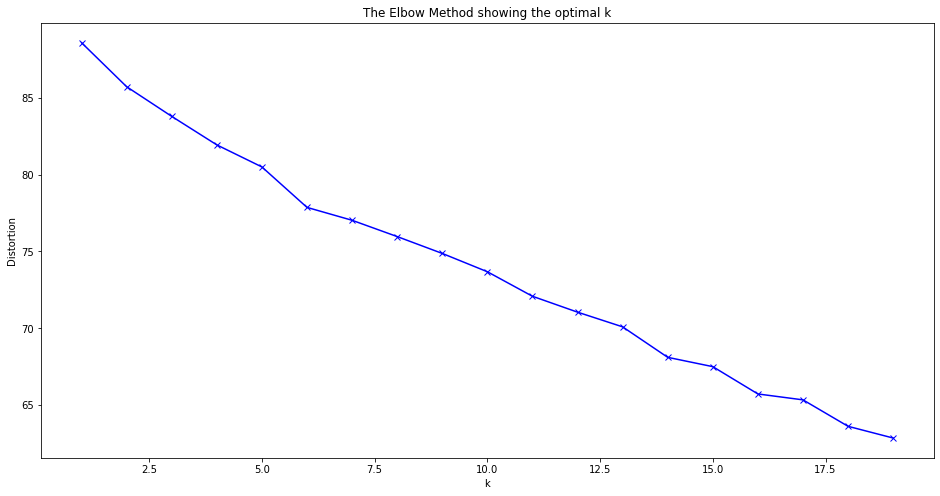

In [253]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [101]:
#bigrams

from sklearn.cluster import KMeans
import numpy as np
kmeans = KMeans(n_clusters=20, random_state=0)
kmeans.fit(X2)

print("Top terms per cluster:")
order_centroids=kmeans.cluster_centers_.argsort()[:, ::-1]
terms=vectorizer2.get_feature_names()
for i in range(20):
    print("Cluster %d:" % i)
    top_ten_words=[terms[ind] for ind in order_centroids[i,:15]]
    print('%s '  % top_ten_words)
    print()
   # print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))

Top terms per cluster:
Cluster 0:
['expir time', 'frame pleas', 'pleas reschedul', 'nymex expir', 'time frame', 'gabriel franconaenronenron', 'ga power', 'ga price', 'ga report', 'ga requir', 'ga sale', 'ga side', 'ga significantli', 'ga trade', 'zuniga investbgacom'] 

Cluster 1:
['from matt', 'matt motley', 'ray nile', 'fyi ray', 'motley am', 'price capspdf', 'nile price', 'subject fyi', 'corp from', 'north america', 'enron north', 'pm enron', 'america corp', 'allenhouectect cc', 'am to'] 

Cluster 2:
['posit manag', 'consolid posit', 'posit screen', 'deal ticker', 'chang deal', 'physic ga', 'posit issu', 'singl point', 'posit transport', 'trade captur', 'issu to', 'set meet', 'consolid physicalfinanci', 'td deal', 'subject consolid'] 

Cluster 3:
['construct loan', 'per lot', 'improv loan', 'presold unit', 'loan would', 'land cost', 'gener partner', 'lot improv', 'land loan', 'spec loan', 'loan presold', 'loan valu', 'loan name', 'equiti requir', 'limit partnership'] 

Cluster 4:
['

In [ ]:
from sklearn.cluster import KMeans
distortions2 = []
K2 = range(1,50)
for k in K2:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X2)

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(K2, distortions2, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [102]:
#trigrams
from sklearn.cluster import KMeans
import numpy as np
kmeans = KMeans(n_clusters=20, random_state=0)
kmeans.fit(X3)

print("Top terms per cluster:")
order_centroids=kmeans.cluster_centers_.argsort()[:, ::-1]
terms3=vectorizer3.get_feature_names()
for i in range(20):
    print("Cluster %d:" % i)
    top_ten_words=[terms3[ind] for ind in order_centroids[i,:15]]
    print('%s '  % top_ten_words)
    print()

Top terms per cluster:
Cluster 0:
['problem access west', 'can pleas make', 'tim mike grigsbi', 'pleas make sure', 'sure activ password', 'grigsbi problem access', 'password thank phillip', 'activ password thank', 'power site can', 'make sure activ', 'mike grigsbi problem', 'site can pleas', 'access west power', 'west power site', 'gabriel franconaenronenron randi'] 

Cluster 1:
['cash flow statement', 'land improv who', 'markup subcontractor gener', 'what happen initi', 'capacityregard ownership liabil', 'borrow loan recours', 'use name these', 'these question probabl', 'distribut debt which', 'compani individu alreadi', 'origin invest is', 'westgat project ownership', 'futur loan whi', 'input investor select', 'sold close profit'] 

Cluster 2:
['issu to do', 'singl point contact', 'posit issu to', 'posit transport trade', 'subject consolid posit', 'transport trade captur', 'physicalfinanci posit transport', 'td deal ticker', 'consolid posit screen', 'consolid posit issu', 'consolid p